In [16]:
import numpy as np

def levenshtein(seq1, seq2):
    size_x = len(seq1) + 1
    size_y = len(seq2) + 1
    matrix = np.zeros ((size_x, size_y))
    for x in range(size_x):
        matrix [x, 0] = x
    for y in range(size_y):
        matrix [0, y] = y

    for x in range(1, size_x):
        for y in range(1, size_y):
            if seq1[x-1] == seq2[y-1]:
                matrix [x,y] = min(
                    matrix[x-1, y] + 1,
                    matrix[x-1, y-1],
                    matrix[x, y-1] + 1
                )
            else:
                matrix [x,y] = min(
                    matrix[x-1,y] + 1,
                    matrix[x-1,y-1] + 1,
                    matrix[x,y-1] + 1
                )
    #print (matrix)
    return (matrix[size_x - 1, size_y - 1])

In [17]:
import pandas as pd
df = pd.read_csv('ex_lan6.csv',delimiter=';',encoding='latin')

In [8]:
df = df.loc[:,:'OC']

In [3]:
df.head()

,FR,EN,DE,ES,CT,IT,RU,PL,UK,AZ,...,MK,LA,EU,WA,ML,LU,IS,IR,OC,PB
0,maison,House,Haus,casa,casa,casa,dom,dom,Budynok,Ev,...,Kuka,domum,Etxea,ty,Dar,Haus,Hus,Teach,ostal,casa
1,ville,city,Stadt,ciudad,ciutat,citta,gorod,miasto,misto,sahar,...,grad,urbs,hiri,ddinas,belt,Stad,borg,cathrach,ciutat,cite
2,porte,door,Tur,puerta,porta,porta,dver,drzwi,dveri,qapi,...,vrata,ianua,ate,drws,bieb,Dier,hurdh,doras,porta,porta
3,route,road,Strasse,carretera,carretera,strada,doroga,droga,doroha,Yol,...,pat,via,errepide,ffordd,fit triq,Strooss,vegur,bothar,rota,via
4,homme,man,Mann,hombre,home,uomo,chelovek,mezczyzna,lyudyna,adam,...,Covek,vir,gizon,dyn,ragel,Mann,madhur,fear,ome,omo


In [18]:
df.columns

Index(['FR', 'EN', 'DE', 'ES', 'CT', 'IT', 'RU', 'PL', 'UK', 'AZ', 'RO', 'NL',
       'TU', 'GR', 'HU', 'FI', 'EE', 'CZ', 'PT', 'SW', 'SR', 'BU', 'AR', 'HR',
       'DN', 'AL', 'SK', 'NO', 'GE', 'BL', 'LT', 'GA', 'BH', 'SV', 'LV', 'YI',
       'SC', 'MK', 'LA', 'EU', 'WA', 'ML', 'LU', 'IS', 'IR', 'OC', 'PB'],
      dtype='object')

In [9]:
df = df.drop(['AZ', 'TU', 'AR', 'GE', 'YI'], axis=1)

In [19]:
df = df[['LA','IT','CT','ES','GA','PT','RO','OC','FR','EN','NL','LU','DE','DN','NO','SW','IS']]

In [20]:
df.shape

(94, 17)

In [21]:
colname = df.columns

In [22]:
def comp(l1, l2) :
    dl = 0
    for index, row in df.iterrows(): 
        dl += levenshtein(row[l1],row[l2])
    return (df.columns[l1], df.columns[l2], dl)

In [23]:
dfL = pd.DataFrame(index=colname, columns=colname)

for i in range(0,len(df.columns)) :
    for j in range(0,len(df.columns)):
        r = comp(i,j)
        dfL[r[0]][r[1]] = r[2]

In [25]:
dfL

,LA,IT,CT,ES,GA,PT,RO,OC,FR,EN,NL,LU,DE,DN,NO,SW,IS
LA,0,490,478,507,478,501,506,461,514,501,556,569,582,558,520,541,602
IT,490,0,361,387,355,384,489,337,379,511,588,599,625,561,559,551,617
CT,478,361,0,292,263,347,461,250,362,461,560,554,571,541,524,507,584
ES,507,387,292,0,233,316,498,366,422,514,591,599,620,587,571,561,632
GA,478,355,263,233,0,277,462,354,417,479,574,579,596,560,539,527,589
PT,501,384,347,316,277,0,507,388,427,498,600,601,612,573,561,542,618
RO,506,489,461,498,462,507,0,459,508,487,581,574,592,568,548,521,587
OC,461,337,250,366,354,388,459,0,265,444,552,546,571,544,519,505,577
FR,514,379,362,422,417,427,508,265,0,490,594,597,605,566,559,558,622
EN,501,511,461,514,479,498,487,444,490,0,481,473,502,452,423,425,516


In [46]:
dfD = pd.DataFrame(index=colname, columns=['x','y','z'])
for index, row in dfD.iterrows(): 
    row['x'] = np.random.random_sample()
    row['y'] = np.random.random_sample()
    row['z'] = np.random.random_sample()

In [40]:
dfD.head()

,x,y,z
LA,0.582007,0.779993,0.76438
IT,0.0198138,0.114836,0.339989
CT,0.476026,0.808541,0.153756
ES,0.365606,0.985297,0.593244
GA,0.234983,0.201028,0.17641


In [47]:
from math import *
dfL2 = pd.DataFrame(index=colname, columns=colname)

for i in range(0,len(dfD.index)) :
    for j in range(0,len(dfD.index)):
        d = sqrt((dfD['x'][i]-(dfD['x'][j]))**2+(dfD['y'][i]-(dfD['y'][j]))**2+(dfD['z'][i]-(dfD['z'][j]))**2)
        dfL2[dfD.index[i]][dfD.index[j]] = d
dfL2.head()

,LA,IT,CT,ES,GA,PT,RO,OC,FR,EN,NL,LU,DE,DN,NO,SW,IS
LA,0,0.664801,0.673162,0.885796,0.396654,0.306545,0.469504,0.504998,0.807051,0.778521,0.955916,0.337338,0.650783,0.320315,0.778162,0.691655,0.343748
IT,0.664801,0,0.953619,0.991161,0.603198,0.959188,0.878688,0.600942,0.833497,1.20282,0.778277,0.368675,0.773464,0.567496,0.541666,0.720703,0.582041
CT,0.673162,0.953619,0,0.654917,0.657534,0.816642,0.248633,0.614082,0.325696,0.644193,0.684842,0.717156,0.224231,0.644519,0.715051,0.460449,0.782963
ES,0.885796,0.991161,0.654917,0,1.0591,1.0226,0.61233,1.04452,0.585783,0.507295,0.460544,0.930665,0.670037,0.619857,0.515324,0.338556,1.11717
GA,0.396654,0.603198,0.657534,1.0591,0,0.637487,0.586758,0.140792,0.737328,1.04693,0.965884,0.273928,0.557921,0.580283,0.817562,0.766259,0.166341


In [50]:
dfL = dfL.astype("float32")
dfL2 = dfL2.astype("float32")

In [43]:
import statistics as st

In [51]:
c1 = st.mean(dfL.corrwith(dfL2))
d1 = min(dfL.corrwith(dfL2))

In [52]:
c1

0.4600526781281408

In [53]:
dfDT = dfD.copy()

In [54]:
from IPython.display import display, clear_output
import sys
from sty import fg, Style, RgbFg

In [55]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

In [36]:
p = 0.05

for x in range (0,500) :   
    for index, row in dfDT.iterrows(): 
        row['x'] = np.random.normal(row['x'], p, 1)[0]
        row['y'] = np.random.normal(row['y'], p, 1)[0]
        row['z'] = np.random.normal(row['z'], p, 1)[0]

    for i in range(0,len(dfDT.index)) :
        for j in range(0,len(dfDT.index)):
            d = sqrt((dfDT['x'][i]-(dfDT['x'][j]))**2+(dfDT['y'][i]-(dfDT['y'][j]))**2+(dfDT['z'][i]-(dfDT['z'][j]))**2)
            dfL2[dfDT.index[i]][dfDT.index[j]] = d
    dfL2
    dfL = dfL.astype("float32")
    dfL2 = dfL2.astype("float32")
    c2 = st.mean(dfL.corrwith(dfL2))
    d2 = min(dfL.corrwith(dfL2))

    if c2 > c1 :
        dfD = dfDT.copy()
        c1 = c2
        d1 = d2
    else :
        dfDT = dfD.copy()
        
    sys.stdout.flush()
    clear_output(wait=True)
    print(str(round(c1*100,4))+" ("+str(round(d1*100,4))+")")
    RGB = (dfD - dfD.min()) / (dfD.max() - dfD.min())*255
    for index, row in RGB.iterrows(): 
        fg.color = Style(RgbFg(int(row['x']), int(row['y']), int(row['z'])))
        buf = fg.color + row.name + fg.rs
        print(buf, sep='\n')

print(c1)

88.1602 (78.4689)
LA
IT
CT
ES
GA
PT
RO
OC
FR
EN
NL
LU
DE
DN
NO
SW
IS
0.8816022417203184


82.0519 (70.1501)
0.8205193557103719


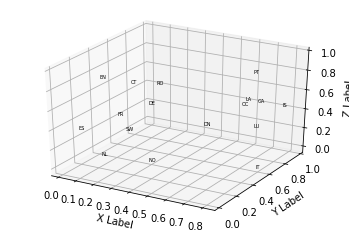

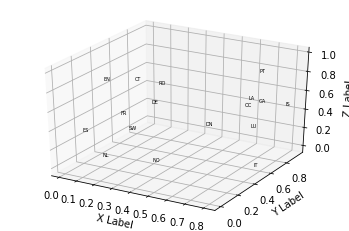

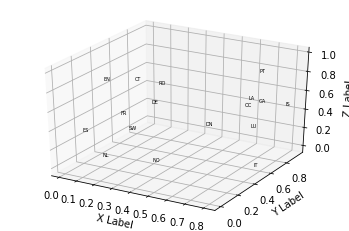

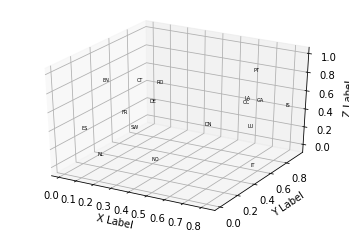

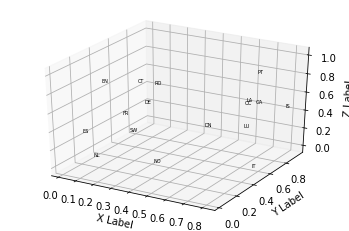

...

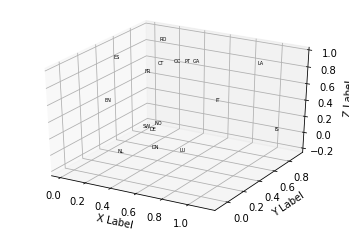

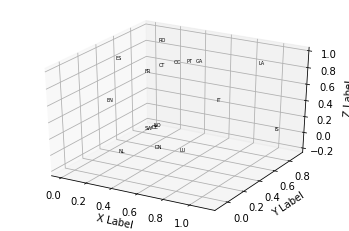

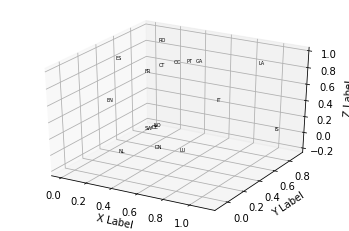

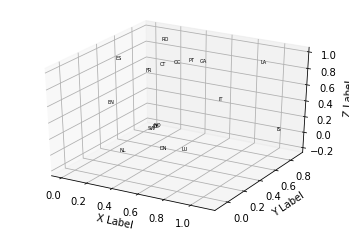

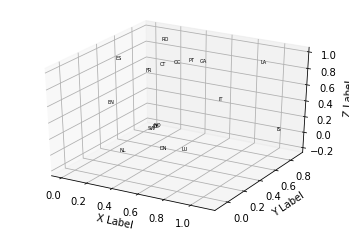

In [56]:
p = 0.01

for x in range (0,500) :   
    for index, row in dfDT.iterrows(): 
        row['x'] = np.random.normal(row['x'], p, 1)[0]
        row['y'] = np.random.normal(row['y'], p, 1)[0]
        row['z'] = np.random.normal(row['z'], p, 1)[0]

    for i in range(0,len(dfDT.index)) :
        for j in range(0,len(dfDT.index)):
            d = sqrt((dfDT['x'][i]-(dfDT['x'][j]))**2+(dfDT['y'][i]-(dfDT['y'][j]))**2+(dfDT['z'][i]-(dfDT['z'][j]))**2)
            dfL2[dfDT.index[i]][dfDT.index[j]] = d
    dfL2
    dfL = dfL.astype("float32")
    dfL2 = dfL2.astype("float32")
    c2 = st.mean(dfL.corrwith(dfL2))
    d2 = min(dfL.corrwith(dfL2))

    if c2 > c1 :
        dfD = dfDT.copy()
        c1 = c2
        d1 = d2
    else :
        dfDT = dfD.copy()
        
    sys.stdout.flush()
    clear_output(wait=True)
    print(str(round(c1*100,4))+" ("+str(round(d1*100,4))+")")
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for index, row in dfD.iterrows(): 
        xs = row['x']
        ys = row['y']
        zs = row['z']
        n = row.name
        ax.scatter(xs, ys, zs, marker=None,s=0)
        ax.text(xs, ys, zs, n, fontsize=5)
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    #fig = plt.figure(1, figsize=(25, 8))
    #plt.show()
    plt.savefig('img/lan_algo_red'+str(x)+'.png',dpi=200)

print(c1)

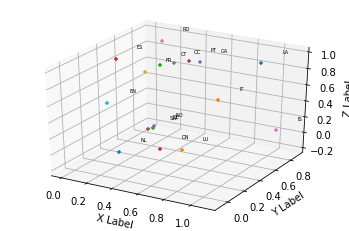

In [57]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for index, row in dfD.iterrows(): 
    xs = row['x']
    ys = row['y']
    zs = row['z']
    n = row.name
    ax.scatter(xs, ys, zs, marker="+")
    ax.text(xs+0.1, ys+0.1, zs+0.1, n, fontsize=5)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

fig = plt.figure(1, figsize=(25, 8))
 
plt.show()

#for angle in range(0, 360):
#    ax.view_init(30, angle)
#    plt.draw()
#    plt.pause(.001)

In [58]:
RGB = round((dfD - dfD.min()) / (dfD.max() - dfD.min())*239+16,0)

In [59]:
RGB

,x,y,z
LA,228.979,207.376,250.538
IT,154.204,219.377,130.071
CT,57.6208,213.623,197.997
ES,19.0437,151.72,232.534
GA,121.276,220.405,219.409
PT,116.528,196.13,231.41
RO,54.0777,225.046,255
OC,56.813,255,184.966
FR,16,239.697,158.493
EN,88.6711,16,204.483


In [60]:
for index, row in RGB.iterrows(): 

    fg.color = Style(RgbFg(int(row['x']), int(row['y']), int(row['z'])))
    #print((int(row['x']), int(row['y']), int(row['z'])))
    
    buf = fg.color + row.name + fg.rs

    print(buf, sep='\n')

LA
IT
CT
ES
GA
PT
RO
OC
FR
EN
NL
LU
DE
DN
NO
SW
IS
